<a href="https://colab.research.google.com/github/randuserr/pdi-tp-final-fire-detection/blob/main/Fire_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Fast and Efficient Method for Fire Detection Using Image Processing

#Configuración

##Importar Bibliotecas

In [58]:
#from utils import *
#from utils.r import *
#from utils.p import *
from skimage import data, util
from skimage.color import rgb2lab, lab2lch, rgba2rgb, lab2rgb, rgb2hsv, hsv2rgb
import numpy as np
import math
import skimage.io as io
from matplotlib.ticker import LinearLocator
from matplotlib.ticker import LinearLocator
import cv2
from os import listdir
from os.path import isfile, join
from matplotlib import pyplot as plt
from matplotlib import cm

##Funciones Auxiliares

In [59]:
def load_image(image_path):
    image = io.imread(image_path)
    return image

def show_image(image):
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image)

def binarizar(imag, thres, index):
    h, w, _ = imag.shape
    img_res = np.zeros((h, w))
    for i in range(h):
        for j in range(w):
            if imag[i, j, index] >= thres:
                img_res[i, j] = 1
    return img_res


def statistical_ciel(img_lab):
    return (
        np.mean(img_lab[:, :, 0]),
        np.mean(img_lab[:, :, 1]),
        np.mean(img_lab[:, :, 2]),
    )

In [60]:
def print_ps(p1, p2, p3):
    #DE LA DOCUMENTACIÓN DE MATPLOTLIB
    fig, ax = plt.subplots(1, 3, subplot_kw={"projection": "3d"}, figsize=(10, 10))
    # fig, axes = plt.subplots(2, 4, figsize=(15, 8))

    # Make data.
    X = np.arange(0, 24, 1)
    Y = np.arange(0, 24, 1)
    X, Y = np.meshgrid(X, Y)
    R = (X, Y)
    Z1 = p1[R]
    Z2 = p2[R]
    Z3 = p3[R]

    # Plot the surface.
    surf1 = ax[0].plot_surface(
        Y, X, Z1, cmap=cm.coolwarm, linewidth=0, antialiased=False
    )

    surf2 = ax[1].plot_surface(
        X, Y, Z2, cmap=cm.coolwarm, linewidth=0, antialiased=False
    )

    surf3 = ax[2].plot_surface(
        X, Y, Z3, cmap=cm.coolwarm, linewidth=0, antialiased=False
    )

    ax[0].set_xlabel("a")
    ax[0].set_ylabel("L")
    ax[0].invert_xaxis()
    ax[0].invert_yaxis()

    ax[1].set_xlabel("L")
    ax[1].set_ylabel("b")
    ax[1].invert_yaxis()

    ax[2].set_xlabel("a")
    ax[2].set_ylabel("b")
    ax[2].invert_yaxis()
    # Add a color bar which maps values to colors.
    # fig.colorbar(surf, shrink=0.5, aspect=5)

    plt.show()


In [61]:
def armar_img_cc(ccs,h,w,thres=1):
    img_ccs=np.zeros((h,w))
    cant_ccs_ej=0
    for cc in ccs:
        if len(cc)>thres:
            cant_ccs_ej+=1
            for p in cc:
                img_ccs[p]=1

    return img_ccs

def armar_img_cc_colores(ccs,h,w,thres=1):
    img_ccs=np.zeros((h,w,3))
    tot_ccs=0
    sat=1
    val=1

    for cc in ccs:
        if len(cc)>thres:
            tot_ccs+=1

    cant_ccs = 0
    for idx, cc in enumerate(ccs):
        if len(cc)>thres:
            hue = cant_ccs / tot_ccs
            cant_ccs += 1
            for p in cc:
                img_ccs[p] = [hue,sat,val]

    return hsv2rgb(img_ccs)

def zoom_componentes_conexas(componentes_conexas, h0, w0):

    limite_1_x, limite_1_y,  limite_2_x, limite_2_y = h0, w0, 0, 0

    for cc in componentes_conexas:
        for x, y in cc:
            if x < limite_1_x:
                limite_1_x = x
            if y < limite_1_y:
                limite_1_y = y
            if x > limite_2_x:
                limite_2_x = x
            if y > limite_2_y:
                limite_2_y = y

    limite_1_x = max(limite_1_x-15, 0)
    limite_1_y = max(limite_1_y-15, 0)
    limite_2_x = min(limite_2_x+15, h0-1)
    limite_2_y = min(limite_2_y+15, w0-1)

    return limite_1_x, limite_1_y,  limite_2_x, limite_2_y

In [62]:
def imprimir_rs_mask(imagen, r1, r2, r3, r4):
    and_img = np.logical_and(r1, r2)
    and_img = np.logical_and(and_img, r3)
    and_img = np.logical_and(and_img, r4)
    times_img = np.zeros_like(imagen)
    times_img[:, :, 0] = and_img * imagen[:, :, 0]
    times_img[:, :, 1] = and_img * imagen[:, :, 1]
    times_img[:, :, 2] = and_img * imagen[:, :, 2]

    fig, axes = plt.subplots(1, 3, figsize=(8, 8))
    ax = axes.ravel()
    ax[0].imshow(imagen)
    ax[0].axis("off")
    ax[1].imshow(and_img, cmap=plt.cm.gray)
    ax[1].axis("off")
    ax[2].imshow(times_img)
    ax[2].axis("off")

In [63]:
def regenerate_video(video_guardar, path):
    h,w,_=video_guardar[0].shape
    vw_device=cv2.VideoWriter(path,fourcc=cv2.VideoWriter_fourcc(*'MJPG') ,fps=15,frameSize=(w,h),isColor=True)

    opened = vw_device.isOpened()
    if opened:
        print("guardando video")

    for i in range(len(video_guardar)):
        frame_video=video_guardar[i]
        frame_BGR=cv2.cvtColor(frame_video, cv2.COLOR_BGR2RGB)
        vw_device.write(frame_BGR)
    vw_device.release()

    return opened

##Ps calculadas

###Generación de Ps

Esto lo corremos una única vez y se guarda en p1.txt, p2.txt, p3.txt

In [64]:
# def contar_valores(img, mask):

#     p1 = np.zeros((24, 24))
#     p2 = np.zeros((24, 24))
#     p3 = np.zeros((24, 24))

#     h, w, _ = img.shape
#     for i in range(h):
#         for j in range(w):
#             if mask[i, j]:
#                 # aumentar en 1 la,lb,ab
#                 l = img[i, j, 0]
#                 a = img[i, j, 1]
#                 b = img[i, j, 2]
#                 l_ind = math.floor(24 * l / 101)
#                 a_ind = math.floor(24 * (a + 110) / 221)
#                 b_ind = math.floor(24 * (b + 110) / 221)
#                 p1[l_ind, a_ind] += 1
#                 p2[l_ind, b_ind] += 1
#                 p3[a_ind, b_ind] += 1
#     return p1, p2, p3

# def preparar_data_set():

#     p1 = np.zeros((24, 24))
#     p2 = np.zeros((24, 24))
#     p3 = np.zeros((24, 24))

#     fuego_path = "../imagenes_segmentadas/images_prepped_train/"
#     masks_path = "../imagenes_segmentadas/annotations_prepped_train/"
#     archivos_fuego = listdir(fuego_path)
#     archivos_masks = listdir(masks_path)

#     contador = 0

#     for imagen_fuego_path, mask_fuego_path in zip(archivos_fuego, archivos_masks):
#         contador += 1
#         if contador % 20 == 0:
#             print(contador+"/"+len(archivos_fuego))

#         imagen_fuego_rgb = load_image(
#             fuego_path + str(imagen_fuego_path))

#         mask_fuego = load_image(
#             masks_path + str(mask_fuego_path))

#         imagen_fuego_lab = rgb2lab(imagen_fuego_rgb)
#         p1_img, p2_img, p3_img = contar_valores(imagen_fuego_lab, mask_fuego)

#         p1 += p1_img
#         p2 += p2_img
#         p3 += p3_img

#     return p1, p2, p3

# p1, p2, p3 = preparar_data_set()

# with open("p1.txt", "wb") as f:
#     np.savetxt(f, p1)

# with open("p2.txt", "wb") as f:
#     np.savetxt(f, p2)

# with open("p3.txt", "wb") as f:
#     np.savetxt(f, p3)

In [ ]:
#no lo usamos

# def ps(vec_imgs,vec_masks):
#   p_ab=np.zeros((24,24))
#   p_la=np.zeros((24,24))
#   p_lb=np.zeros((24,24))
#   cant=len(vec_imgs)
#   pxs=0

#   for k in range(0,cant):
#     img=vec_imgs[k]
#     mask=vec_masks[k]
#     h,w,_=img.shape
#     for i in range(h):
#       for j in range(w):
#         if mask[i,j]:
#           #aumentar en 1 la,lb,ab
#           l=img[i,j,0]
#           a=img[i,j,1]
#           b=img[i,j,2]
#           l_ind=math.floor(24*l/101)
#           a_ind=math.floor(24*(a+110)/221)
#           b_ind=math.floor(24*(b+110)/221)
#           p_la[l_ind,a_ind]+=1
#           p_lb[l_ind,b_ind]+=1
#           p_ab[a_ind,b_ind]+=1
#           px+=1

#   p_la=p_la/px
#   p_lb=p_lb/px
#   p_ab=p_ab/px

#   return (p_la,p_lb,p_ab)


###Lectura de Ps

In [174]:
p1_unorm = np.loadtxt("./ps/p1.txt", usecols=range(24))
p2_unorm = np.loadtxt("./ps/p2.txt", usecols=range(24))
p3_unorm = np.loadtxt("./ps/p3.txt", usecols=range(24))

p1=p1_unorm/np.sum(p1_unorm)
p2=p2_unorm/np.sum(p2_unorm)
p3=p3_unorm/np.sum(p3_unorm)

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00

In [114]:
#from google.colab import drive
#drive.mount('/content/drive')

##Cargar Video

In [166]:
def read_video(path):
    vc_device=cv2.VideoCapture(path)
    hay_frame,imagen_frame_prueba=vc_device.read()
    video = []

    while hay_frame:
        img_rgb=cv2.cvtColor(imagen_frame_prueba, cv2.COLOR_BGR2RGB)
        video.append(img_rgb)
        hay_frame,imagen_frame_prueba=vc_device.read()

    return video

video_fire1=read_video("./images/fire1.avi")

#Teoría

##Algoritmo

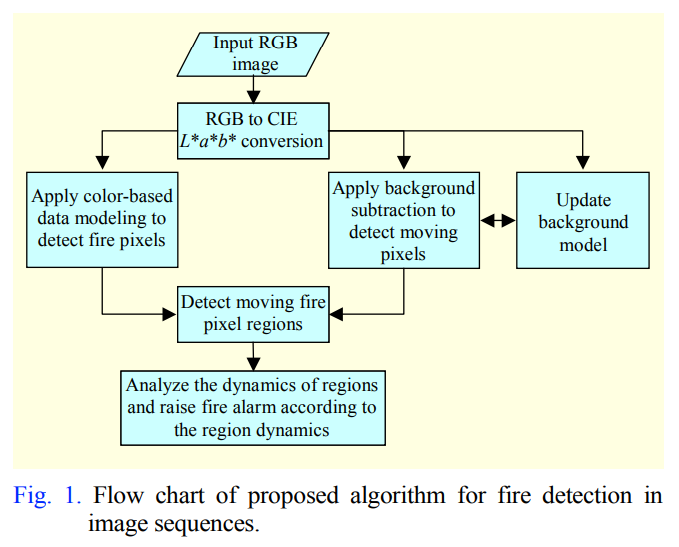

##Cie-Lab

$
\begin{bmatrix}
X\\
Y\\
Z
\end{bmatrix} =
\begin{bmatrix}
0.412453 & 0.357580 & 0.180423\\
0.212671 & 0.715160 & 0.072169\\
0.019334 & 0.119193 & 0.950227
\end{bmatrix}
\times
\begin{bmatrix}
R\\
G\\
B
\end{bmatrix}
$

$
L^* =
\left\{
    \begin{array}{lcc}
        116 \times (Y/Y_n)^{1/3}-16 & si & (Y/Y_n) > 0.008856,\\ \\
        7.787 \times t + 16/116 & si\ no
    \end{array}
\right.
$

$
a^* = 500 \times (f(X/X_n) - f(Y/Y_n))
$

$
b^* = 200 \times (f(Y/Y_n) - f(Z/Z_n))
$

$
f(t) =
\left\{
    \begin{array}{lcc}
        t^{1/3} & si & t > 0.008856,\\ \\
        903.3 \times (Y/Y_n) & sino
    \end{array}
\right.
$

Con $X_n,\ Y_n$ y $Z_n$ siendo los valores de referencia para el color blanco.

###Estadísticas Cie-lab

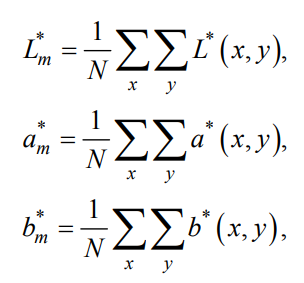

In [69]:
def statistical_ciel(img_lab):
  return (np.mean(img_lab[:,:,0]),np.mean(img_lab[:,:,1]),np.mean(img_lab[:,:,2]))

#Análisis estático de con información de color: $R_s$

## $R1,\ R2,\ R3,\ R4$

$
R1(x,y) =
\left\{
    \begin{array}{lcc}
        1 & si & L^*(x, y) \geq L^*_m,\\
        0 & si\ no
    \end{array}
\right.
$

$
R2(x,y) =
\left\{
    \begin{array}{lcc}
        1 & si & a^*(x, y) \geq a^*_m,\\
        0 & si\ no
    \end{array}
\right.
$

$
R3(x,y) =
\left\{
    \begin{array}{lcc}
        1 & si & b^*(x, y) \geq b^*_m,\\
        0 & si\ no
    \end{array}
\right.
$

$
R4(x,y) =
\left\{
    \begin{array}{lcc}
        1 & si & b^*(x, y) \geq a^*(x, y),\\
        0 & si\ no
    \end{array}
\right.
$

De igual manera, creamos las funciones `r1`, `r2`, `r3` y `r4`; que calculan $R1$, $R2$, $R3$ y $R4$ respectivamente.

En el siguiente bloque, podemos ver las máscaras creadas por estas reglas para 3 imágenes a modo de ejemplo:

In [70]:
def r1(img_lab, lm):
    return binarizar(img_lab, lm, 0)

def r2(img_lab, am):
    return binarizar(img_lab, am, 1)

def r3(img_lab, bm):
    return binarizar(img_lab, bm, 2)

def r4(img_lab):
    h, w, _ = img_lab.shape
    img_res = np.zeros((h, w))
    for i in range(h):
        for j in range(w):
            if img_lab[i, j, 2] >= img_lab[i, j, 1]:
                img_res[i, j] = 1
    return img_res

##$R_5$

La verosimilitud de que un pixel pertenezca a un fuego puede utilizarse para detectar dichos píxeles mediante un simple _thresholding_:

$
R5(x,y) =
\left\{
    \begin{array}{lcc}
        1 & si & P(L^*(x,y), a^*(x,y), b^*(x,y)) \geq \alpha,\\
        0 & si\ no
    \end{array}
\right.
$

Donde $\alpha$ es el valor de _threshold_.

#### Función de verosimilitud

Creamos un histograma de píxeles pertenecientes a fuego, para cada uno de los 3 planos de color: $(L^*,a^*),\ (L^*,b^*)$ y $(a^*,b^*)$

$P(L^*, a^*, b^*) \stackrel{def}{=} P(L^*, a^*) P(L^*, b^*) P(a^*, b^*)$

Donde $P(L^*, a^*),\ P(L^*, b^*)$ y $P(a^*, b^*)$ son las funciones que denotan la verosimilitud de que $P(L^*, a^*),\ P(L^*, b^*)$ y $(a^*, b^*)$ pertenezcan a un fuego, respectivamente.

La función `ps` recibe las imágenes y las máscaras que segmentan el fuego presente en las mismas, y calcula estadísticamente los valores $P(L^*, a^*)$, $P(L^*, b^*)$, $P(a^*, b^*)$

Obtenemos variables globales `p1`, `p2`, `p3`

In [121]:
def p_lab(l,a,b):
  l_ind=math.floor(24*l/101)
  a_ind=math.floor(24*(a+110)/221)
  b_ind=math.floor(24*(b+110)/221)
  return p1[l_ind,a_ind]*p2[l_ind,b_ind]*p3[a_ind,b_ind]

In [180]:
def r5(img_lab, alfa=0.00000016):
    # alfa=0.000016
    h, w, _ = img_lab.shape
    img_res = np.zeros((h, w))
    for i in range(h):
        for j in range(w):
            l = img_lab[i, j, 0]
            a = img_lab[i, j, 1]
            b = img_lab[i, j, 2]
            if p_lab(l, a, b) >= alfa:
                img_res[i, j] = 1
    return img_res

##Máscara estática final

In [115]:
def final_rs(img_lab, alfa=1e-6):

    h, w, _ = img_lab.shape
    ln, an, bn = statistical_ciel(img_lab)
    r_1 = r1(img_lab, ln)
    r_2 = r2(img_lab, an)
    r_3 = r3(img_lab, bn)
    r_4 = r4(img_lab)
    r_5 = r5(img_lab, alfa)

    img_res = np.zeros((h, w))
    for i in range(h):
        for j in range(w):
            if r_1[i, j] + r_2[i, j] + r_3[i, j] + r_4[i, j] + r_5[i, j] == 5:
                img_res[i, j] = 1

    return img_res

#Análisis dinámico: Moving Pixels

##Teoría

Frame Difference, Stationary Index, Background detection, Background Difference, Moving Pixels.

 $FD(x,y,t) = \begin{cases}
 1 & \; \text{si $|L(x,y,t)-L(x,y,t-1)|\geq T_{FD}$}  \\  
 0 & \text{sino} \\   
 \end{cases}$



$ SI(x,y,t) = \begin{cases}
 SI(x,y,t-1)+1 & \; \text{si $FD(x,y,t)=0$}  \\  
 0 & \text{sino} \\   
 \end{cases}$

$\displaystyle BG(x,y,t) = \begin{cases}
 L(x,y,t) & \; \text{si $SI =  T_{SI}$}  \\  
 BG(x,y,t-1) & \text{sino} \\   
 \end{cases}$



$ BD(x,y,t) = \begin{cases}
 1 & \; \text{si $|L(x,y,t)-BG(x,y,t-1)|\geq T_{BD}$}  \\  
 0 & \text{sino} \\   
 \end{cases}$

$M(x,y)=FD(x,y,t) \; OR \; BD(x,y,t)$

##Thresholds

$\displaystyle \tau(DI) = \begin{cases}
 \mu(DI)+\sigma(DI) & \; \text{si  $\mu(DI)+\sigma(DI)>10$}  \\  
 10 & \text{sino} \\   
 \end{cases}$

In [208]:
def mean_di_np(img_di):
  return np.mean(img_di)

def std_dev_di_np(img_di):
  return np.std(img_di)

In [209]:
def tau(img_di):
  mean=mean_di_np(img_di)
  sigma=std_dev_di_np(img_di)
  if mean+sigma>=10:
    res=mean+sigma
  else:
    res = 10
  return res

##Frame Difference

In [210]:
def frame_difference_dynamic_thres(img_lab_t, img_lab_t_ant):
    h, w, _ = img_lab_t.shape
    img_fd = np.zeros((h, w))
    dif_img = np.abs(img_lab_t[:, :, 0].astype(np.int32) - img_lab_t_ant[:, :, 0].astype(np.int32) )
    thresh = tau(dif_img)
    for i in range(h):
        for j in range(w):
            dif=dif_img[i,j]
            if dif >= thresh:
                img_fd[i,j] = 1
    return img_fd

In [211]:
#Devuelve todos los frame diff para todos el video
def frame_differences_dynamic_thres(vec_imgs):
    cant=len(vec_imgs)
    img_0=vec_imgs[0]
    h, w, _ = img_0.shape
    fds = np.zeros((cant, h, w))

    for k in range(1, cant):
        img_fd = np.zeros((h, w))
        img = vec_imgs[k]
        img_ant = vec_imgs[k - 1]
        dif_img = np.abs(img[:, :, 0].astype(np.int32) - img_ant[:, :, 0].astype(np.int32))
        thresh = tau(dif_img)
        for i in range(h):
            for j in range(w):
                dif=dif_img[i,j]
                if dif >= thresh:
                    img_fd[i,j] = 1
        fds[k] = img_fd

    return fds

##Stationary Index

In [212]:
def stationary_indexes(vec_imgs):
    cant = len(vec_imgs)
    img_0 = vec_imgs[0]
    h, w, _ = img_0.shape
    sis = np.array(np.zeros((cant, h, w)))
    sis[0] = np.zeros((h, w))

    for k in range(1, cant):
        fd = frame_difference_dynamic_thres(vec_imgs[k], vec_imgs[k - 1])
        si_ant = sis[k - 1]
        si = np.zeros((h, w))
        for i in range(h):
            for j in range(w):
                if fd[i, j] == 0:
                    si[i, j] = si_ant[i, j] + 1
        sis[k] = si

    return sis

###Background Images

In [213]:
def background_images(vec_imgs, thres_si):
    cant = len(vec_imgs)
    img_0 = vec_imgs[0]
    h, w, _ = img_0.shape
    sis = stationary_indexes(vec_imgs)
    bgs = np.zeros((cant, h, w))
    bgs[0] = np.zeros((h, w))

    for k in range(1, cant):
        img = vec_imgs[k]
        bg = bgs[k - 1]
        for i in range(h):
            for j in range(w):
                if sis[k, i, j] == thres_si:
                    l = img[i, j, 0]
                    bg[i, j] = l
        bgs[k] = bg
    return bgs

##Background Difference

In [214]:
def background_difference(vec_imgs,si_thres):
    cant = len(vec_imgs)
    img_0 = vec_imgs[0]
    h, w, _ = img_0.shape
    bds = np.zeros((cant, h, w))
    bgs = background_images(vec_imgs, si_thres)

    for k in range(1, cant):
        img = vec_imgs[k]
        bg_ant = bgs[k - 1]
        dif = np.abs(img[:, :, 0] - bg_ant)
        thresh = tau(dif)
        bd = np.zeros((h, w))
        for x in range(h):
            for y in range(w):
                if dif[x, y] >= thresh:
                    bd[x, y] = 1
        bds[k] = bd
    return bds

##Moving Pixels

In [215]:
def moving_pixel_map(vec_imgs,si_thres=7):
    cant=len(vec_imgs)
    img_0=vec_imgs[0]
    h, w, _ = img_0.shape
    bds = background_difference(vec_imgs,si_thres)
    fds = frame_differences_dynamic_thres(vec_imgs)
    ms = np.zeros((cant, h, w))

    for k in range(cant):
        fd = fds[k]
        bd = bds[k]
        m = np.zeros((h, w))
        for i in range(h):
            for j in range(w):
                if fd[i, j] or bd[i, j]:
                    m[i, j] = 1
        ms[k] = m

    return ms

#Juntando Análisis estático y Dinámico: Candidate Fire Pixels

##Teoría

  Podemos combinar los resultados obtenidos mediante el análisis estático y el dinámico. Definimos los píxeles candidatos a fuego (candidate fire pixels) como:


  $CF(x,y,t)=F(x,y) \; AND \; M(x,y)$

##Candidate Fire Pixels

In [155]:

def candidate_fire_pixels_vec(vec_imgs, si_thres=7, alfa=1e-6):
    cant=len(vec_imgs)
    img_0=vec_imgs[0]
    h, w, _ = img_0.shape
    cfs = np.zeros((cant, h, w))
    ms = moving_pixel_map(vec_imgs,si_thres)
    fs = np.zeros((cant, h, w))

    for k in range(cant):
        imag=vec_imgs[k]
        imag=rgb2lab(imag)
        f = final_rs(imag, alfa)
        fs[k] = f

    for k in range(cant):
        cf = np.zeros((h, w))
        f = fs[k]
        m = ms[k]
        for i in range(h):
            for j in range(w):
                cf[i, j] = f[i, j]*m[i, j]
        cfs[k] = cf

    return cfs

#Análisis de crecimiento: Componentes Conexas

##Teoría

Analizamos las componentes conexas de los candidate fire pixels y vemos cómo se comportan en el tiempo para tomar una decisión según el comportamiento del fuego.


Dado $CF(t)$, consideramos una componente conexa $O(t)$, y llamamos $NO(t)$ a la cantidad de elementos de la componente conexa $O$ en el tiempo $t$. Definimos:


$\displaystyle CGO(t) = \begin{cases}
 CGO(t-1)+1 & \; \text{si $NO(t)\geq NO(t-1)$}  \\  
 CGO(t-1) & \text{sino} \\   
 \end{cases}$


Es decir, contamos en cuántos frames aumentó la cantidad de píxeles con fuego en la componente conexa.


Este contador se utiliza para medir el comportamiento temporal del fuego en las primeras etapas. Esto es, en las primeras etapas el fuego debería crecer espacialmente.


##Componentes Conexas

In [139]:
def componentes_conexas(img_cf):
  h,w=img_cf.shape
  posiciones_con_uno=[]
  componentes_conexas=[] #O(t) lista de listas #cant_elementos_comp_conexas=[] #NO(t) lista de números
  indices_px_unos={}
  a_visitar=[]

  for x in range(h):
    for y in range(w):
      if img_cf[x,y]:
        posiciones_con_uno.append((x,y))
        indices_px_unos[(x,y)]=len(posiciones_con_uno)-1

  cant=len(posiciones_con_uno)
  componente_conexa_correspondiente=np.full(cant,-1)

  for k in range(cant):
    px,py=posiciones_con_uno[k]
    if componente_conexa_correspondiente[k]==-1:
      #crear componente conexa
      componentes_conexas.append([])
      n_cc=len(componentes_conexas)-1
      cant_cc=0
      a_visitar=[(px,py)]

      while len(a_visitar)!=0:
        cc_px,cc_py=a_visitar.pop()
        idx=indices_px_unos[(cc_px,cc_py)]

        componente_conexa_correspondiente[idx]=n_cc
        componentes_conexas[n_cc].append((cc_px,cc_py))
        cant_cc+=1

        #mirar vecinos y asignar componente conexa correspondiente
        for vx in range(max(cc_px-1,0),min(cc_px+2,h)):
          for vy in range(max(cc_py-1,0),min(cc_py+2,w)):
              if img_cf[vx,vy]:
                idx=indices_px_unos[(vx,vy)]
                if componente_conexa_correspondiente[idx]==-1:
                  a_visitar.append((vx,vy))

      if(cant_cc==1):
        [(vx,vy)]=componentes_conexas.pop()
        idx=indices_px_unos[(vx,vy)]
        componente_conexa_correspondiente[idx]=-1

  return componentes_conexas

In [94]:
def componente_conexa_en_el_tiempo(img_cf,posiciones_con_uno,indices_px_unos,componente):
  h1,w1=img_cf.shape
  componente_act=[]

  visitados=np.zeros(len(posiciones_con_uno))
  a_visitar=[]

  for i in range(len(componente)):
    px=componente[i]
    if img_cf[px]==1:
      idx=indices_px_unos[px]
      a_visitar.append(px)
      visitados[idx]=1

  while len(a_visitar)!=0:
    cc_px,cc_py=a_visitar.pop()
    componente_act.append((cc_px,cc_py))
    idx=indices_px_unos[(cc_px,cc_py)]
    visitados[idx]=1
    #mirar vecinos y asignar componente conexa correspondiente
    for vx in range(max(cc_px-1,0),min(cc_px+2,h1)):
      for vy in range(max(cc_py-1,0),min(cc_py+2,w1)):
        if img_cf[vx,vy]==1:
          idx=indices_px_unos[(vx,vy)]
          if visitados[idx]==0:
            a_visitar.append((vx,vy))

  return componente_act

In [95]:
def posiciones_indices_con_uno_img(img_cf):
    h,w=img_cf.shape
    posiciones_con_uno=[]
    indices_px_unos={}
    for x in range(h):
        for y in range(w):
            if img_cf[x,y]:
                posiciones_con_uno.append((x,y))
                indices_px_unos[(x,y)]=len(posiciones_con_uno)-1

    return (indices_px_unos,posiciones_con_uno)


def posiciones_indices_con_uno_video(img_cfs):
    cant=len(img_cfs)
    video_posiciones_con_uno=[]
    video_indices_px_unos=[]

    for k in range(cant):
        img_cf=img_cfs[k]
        indices_px_unos,posiciones_con_uno=posiciones_indices_con_uno_img(img_cf)
        video_posiciones_con_uno.append(posiciones_con_uno)
        video_indices_px_unos.append(indices_px_unos)

    return (video_indices_px_unos,video_posiciones_con_uno)

##CGOS

In [153]:

def cgo(vec_video, inicio, si_thres, alfa=1e-6):
    cfs=candidate_fire_pixels_vec(vec_video, si_thres, alfa)
    comp_conexas=componentes_conexas(cfs[inicio])

    cant_v=len(vec_video)
    cant_cc=len(comp_conexas)
    update_componente_conexa_por_frame=[]

    for i in range(cant_v):
        update_componente_conexa_por_frame.append([])

    cgos=np.zeros((cant_v,cant_cc)) #contador de movimiento por componente conexa
    n_elem_comp=np.zeros((cant_v,cant_cc))

    video_indices_px_unos,video_posiciones_con_uno=posiciones_indices_con_uno_video(cfs)

    for comp_ind in range(cant_cc):
        comp_act=comp_conexas[comp_ind]
        n_elem_comp[inicio,comp_ind]=len(comp_act)
    update_componente_conexa_por_frame[inicio] = comp_conexas
    #componentes_conexas es lista de: lista de posiciones [c1,c2....,cn] -> ci -> [px1....pxm]
    for comp_ind in range(cant_cc):
        comp_act=comp_conexas[comp_ind]
        for k in range(inicio+1,cant_v):
            img_cf=cfs[k]
            comp_act=componente_conexa_en_el_tiempo(img_cf,video_posiciones_con_uno[k],video_indices_px_unos[k],comp_act)
            n_elem_comp[k,comp_ind]=len(comp_act)
            update_componente_conexa_por_frame[k].append(comp_act)

    for comp_ind in range(cant_cc):
        for k in range(1,cant_v):
            if n_elem_comp[k,comp_ind]>n_elem_comp[k-1,comp_ind]:
                cgos[k,comp_ind]=cgos[k-1,comp_ind]+1
            else:
                cgos[k,comp_ind]=cgos[k-1,comp_ind]

    return cgos, update_componente_conexa_por_frame

##Métrica D(t)

In [151]:
def d_metric(cgo,cgo_1s_ant,fps):
    return (cgo-cgo_1s_ant)/fps

def d_metric_video(video, inicio, fps, si_thres=7, alfa=1e-6):
    cgos,_=cgo(video, inicio, si_thres, alfa)
    metrics=[]

    for i in range(inicio+fps,len(video)):
        metrics.append((cgos[i]-cgos[i-fps])/fps)

    return metrics

#Definiciones Tests

###Rs

In [185]:
def test_rs():

    imagen_prueba = load_image("./images/sample2.jpg")
    img_paper1 = load_image("./images/paper_img1.png")
    img_paper2 = load_image("./images/paper_img2.png")

    img_paper1 = rgba2rgb(img_paper1)
    img_paper2 = rgba2rgb(img_paper2)
    img_paper1 = util.img_as_ubyte(img_paper1)
    img_paper2 = util.img_as_ubyte(img_paper2)

    img_lab0 = rgb2lab(imagen_prueba)
    img_lab1 = rgb2lab(img_paper1)
    img_lab2 = rgb2lab(img_paper2)

    lm, am, bm = statistical_ciel(img_lab0)
    r1_img = r1(img_lab0, lm)
    r2_img = r2(img_lab0, am)
    r3_img = r3(img_lab0, bm)
    r4_img = r4(img_lab0)

    lm1, am1, bm1 = statistical_ciel(img_lab1)
    r1_img1 = r1(img_lab1, lm1)
    r2_img1 = r2(img_lab1, am1)
    r3_img1 = r3(img_lab1, bm1)
    r4_img1 = r4(img_lab1)

    lm2, am2, bm2 = statistical_ciel(img_lab2)
    r1_img2 = r1(img_lab2, lm2)
    r2_img2 = r2(img_lab2, am2)
    r3_img2 = r3(img_lab2, bm2)
    r4_img2 = r4(img_lab2)

    fig, axes = plt.subplots(3, 5, figsize=(8, 8))
    ax = axes.ravel()

    ax[0].imshow(imagen_prueba)
    ax[1].imshow(r1_img, cmap=plt.cm.gray)  # R1
    ax[2].imshow(r2_img, cmap=plt.cm.gray)  # R2
    ax[3].imshow(r3_img, cmap=plt.cm.gray)  # R3
    ax[4].imshow(r4_img, cmap=plt.cm.gray)  # R4

    ax[5].imshow(img_paper1)
    ax[6].imshow(r1_img1, cmap=plt.cm.gray)  # R1
    ax[7].imshow(r2_img1, cmap=plt.cm.gray)  # R2
    ax[8].imshow(r3_img1, cmap=plt.cm.gray)  # R3
    ax[9].imshow(r4_img1, cmap=plt.cm.gray)  # R4

    ax[10].imshow(img_paper2)
    ax[11].imshow(r1_img2, cmap=plt.cm.gray)  # R1
    ax[12].imshow(r2_img2, cmap=plt.cm.gray)  # R2
    ax[13].imshow(r3_img2, cmap=plt.cm.gray)  # R3
    ax[14].imshow(r4_img2, cmap=plt.cm.gray)  # R4

    for a in ax:
        a.axis("off")

    ax[0].set_title("original")
    ax[1].set_title("R1")
    ax[2].set_title("R2")
    ax[3].set_title("R3")
    ax[4].set_title("R4")

    fig.tight_layout()
    plt.show()


def test_r5(imagen, alfa=0.00000016):
    imagen_lab=rgb2lab(imagen)
    fig, axes = plt.subplots(1, 2, figsize=(8, 8))
    axes[0].imshow(imagen, cmap=plt.cm.gray)
    axes[0].axis("off")
    axes[1].imshow(r5(imagen_lab, alfa), cmap=plt.cm.gray)
    axes[1].axis("off")

    plt.show()

def imprimir_rs_mask(imagen, r1, r2, r3, r4):
    and_img = np.logical_and(r1, r2)
    and_img = np.logical_and(and_img, r3)
    and_img = np.logical_and(and_img, r4)
    times_img = np.zeros_like(imagen)
    times_img[:, :, 0] = and_img * imagen[:, :, 0]
    times_img[:, :, 1] = and_img * imagen[:, :, 1]
    times_img[:, :, 2] = and_img * imagen[:, :, 2]

    fig, axes = plt.subplots(1, 3, figsize=(8, 8))
    ax = axes.ravel()
    ax[0].imshow(imagen)
    ax[0].axis("off")
    ax[1].imshow(and_img, cmap=plt.cm.gray)
    ax[1].axis("off")
    ax[2].imshow(times_img)
    ax[2].axis("off")
    plt.show()


def test_rs_mask(img_path):

    img_paper1 = load_image(img_path)
    _, _, ch = img_paper1.shape

    if ch == 4:
        img_paper1 = rgba2rgb(img_paper1)
        print(ch)
    img_paper1 = util.img_as_ubyte(img_paper1)
    img_lab1 = rgb2lab(img_paper1)

    lm1, am1, bm1 = statistical_ciel(img_lab1)
    r1_img1 = r1(img_lab1, lm1)
    r2_img1 = r2(img_lab1, am1)
    r3_img1 = r3(img_lab1, bm1)
    r4_img1 = r4(img_lab1)

    imprimir_rs_mask(img_paper1, r1_img1, r2_img1, r3_img1, r4_img1)


def test_final_mask(img_path, alfa=0.00000016):
    imag = load_image(img_path)

    _, _, ch = imag.shape

    if ch == 4:
        imag = rgba2rgb(imag)
    imag = util.img_as_ubyte(imag)

    imag_lab = rgb2lab(imag)
    final_mask = final_rs(imag_lab, alfa)
    times_img = np.zeros_like(imag)
    times_img[:, :, 0] = final_mask * imag[:, :, 0]
    times_img[:, :, 1] = final_mask * imag[:, :, 1]
    times_img[:, :, 2] = final_mask * imag[:, :, 2]

    fig, axes = plt.subplots(1, 3, figsize=(8, 8))
    ax = axes.ravel()
    ax[0].imshow(imag, cmap=plt.cm.gray)
    ax[0].axis("off")
    ax[1].imshow(final_mask, cmap=plt.cm.gray)
    ax[1].axis("off")
    ax[2].imshow(times_img)
    ax[2].axis("off")

    plt.show()

def test_rs_video(imagen):
    imagen_ubyte=util.img_as_ubyte(imagen)
    frame_200_lab=rgb2lab(imagen_ubyte)
    lm_0,am_0,bm_0=statistical_ciel(frame_200_lab)
    r1_0=r1(frame_200_lab,lm_0)
    r2_0=r2(frame_200_lab,am_0)
    r3_0=r3(frame_200_lab,bm_0)
    r4_0=r4(frame_200_lab)

    imprimir_rs_mask(imagen_ubyte,r1_0,r2_0,r3_0,r4_0)

###Frame Difference

In [200]:
def test_frame_difference(video):

    fds=frame_differences_dynamic_thres(video)
    fig, axes = plt.subplots(2, 5, figsize=(30, 8))
    ax = axes.ravel()

    for ax0 in ax:
        ax0.axis('off')

    for i in range(5):
        axes[0][i].imshow(video[i])
        axes[1][i].imshow(fds[i],cmap='gray')

    plt.show()

def test_fd_rs(img1, img2, alfa=0.00000016):

    fds=frame_differences_dynamic_thres([img1, img2])

    rs_mask=final_rs(rgb2lab(img2), alfa)
    new_mask=rs_mask*fds[1]

    fig, axes = plt.subplots(1, 3, figsize=(8, 8))
    ax = axes.ravel()

    frame_idx_masked=img2.copy()
    frame_idx_masked[:,:,0]=frame_idx_masked[:,:,0]*new_mask
    frame_idx_masked[:,:,1]=frame_idx_masked[:,:,1]*new_mask
    frame_idx_masked[:,:,2]=frame_idx_masked[:,:,2]*new_mask

    for ax0 in ax:
        ax0.axis('off')
        axes[0].imshow(img2)
        axes[1].imshow(new_mask,cmap='gray')
        axes[2].imshow(frame_idx_masked,cmap='gray')

    plt.show()


def test_fd_rs_video(video, path="./images/resultados/resultado.avi",alfa=1e-6):

    fds=frame_differences_dynamic_thres(video)

    video_fds = []

    for i in range(len(video)):

        frame = video[i]
        rs_mask = final_rs(rgb2lab(frame), alfa)
        fd_rs_mask = rs_mask * fds[i]

        frame_masked = np.zeros_like(frame)
        frame_masked[:,:,0] = frame[:,:,0] * fd_rs_mask
        frame_masked[:,:,1] = frame[:,:,1] * fd_rs_mask
        frame_masked[:,:,2] = frame[:,:,2] * fd_rs_mask

        combinacion = np.hstack((frame_masked, frame))

        video_fds.append(combinacion)

    regenerate_video(video_fds, path)

### Stationary Index

In [100]:
def test_stationary_index(video):

    sis_ej=stationary_indexes(video)

    fig, axes = plt.subplots(2, len(video), figsize=(30, 8))
    ax = axes.ravel()
    for ax0 in ax:
        ax0.axis('off')

    for i in range(len(video)):
        axes[0][i].imshow(video[i])
        axes[1][i].imshow(sis_ej[i],cmap='gray')

    plt.show()


###Background Image

In [232]:
def test_background_image(video, si_thresh=5):

    #video_fire1_ejemplo_bg=video_fire1[200:211:1]
    bgs_img_ej=background_images(video, si_thresh)

    fig, axes = plt.subplots(2, len(video) - si_thresh+1, figsize=(30, 8))
    ax = axes.ravel()
    for ax0 in ax:
        ax0.axis('off')

    for i in range(si_thresh-1,len(video)):
        axes[0][i-si_thresh].imshow(video[i])
        axes[1][i-si_thresh].imshow(bgs_img_ej[i],cmap='gray')

    plt.show()


###Background Difference

In [102]:
def test_background_difference(video, si_thresh=5):
    bgs_diff_ej=background_difference(video, si_thresh)

    fig, axes = plt.subplots(2, len(video)-si_thresh, figsize=(30, 8))
    ax = axes.ravel()
    for ax0 in ax:
        ax0.axis('off')

    for i in range(len(video)-si_thresh):
        axes[0][i].imshow(video[i+si_thresh])
        axes[1][i].imshow(bgs_diff_ej[i+si_thresh],cmap='gray')

    plt.show()

###Moving Pixel

In [103]:
def test_moving_pixel(video, si_thresh=5):

    moving_px_ej=moving_pixel_map(video, si_thresh)

    fig, axes = plt.subplots(2, len(video)-si_thresh, figsize=(30, 8))
    ax = axes.ravel()
    for ax0 in ax:
        ax0.axis('off')

    for i in range(len(video)-si_thresh):
        axes[0][i].imshow(video[i+si_thresh])
        axes[1][i].imshow(moving_px_ej[i+si_thresh],cmap='gray')

    plt.show()

###Candidate Fire Pixel

In [104]:
def test_candidate_fire(video, si_thresh=5):

    candidate_px_ej=candidate_fire_pixels_vec(video, si_thresh)

    fig, axes = plt.subplots(2, len(video)-si_thresh, figsize=(30, 8))
    ax = axes.ravel()
    for ax0 in ax:
        ax0.axis('off')

    for i in range(len(video)-si_thresh):
        axes[0][i].imshow(video[i+si_thresh])
        axes[1][i].imshow(candidate_px_ej[i+si_thresh], cmap='gray')

    plt.show()


###Componentes Conexas

In [161]:
def test_cc(video, idx, si_thresh=5, min_size=3):

    candidate_px_ej=candidate_fire_pixels_vec(video, si_thresh)

    ccs_ejemplo=componentes_conexas(candidate_px_ej[idx])
    h0,w0 = candidate_px_ej[idx].shape

    img_ccs_ejemplo_componentes=armar_img_cc_colores(ccs_ejemplo,h0,w0,min_size)

    fig, axes = plt.subplots(1, 3, figsize=(8, 4))
    for ax in axes:
        ax.axis('off')

    limite_1_x, limite_1_y,  limite_2_x, limite_2_y = zoom_componentes_conexas(ccs_ejemplo, h0, w0)

    axes[0].imshow(video[idx])
    axes[1].imshow(candidate_px_ej[9],cmap='gray')
    axes[2].imshow(img_ccs_ejemplo_componentes[limite_1_x:limite_2_x, limite_1_y:limite_2_y])
    plt.show()




#test componente_conexa_en_el_tiempo(img_cf,posiciones_con_uno,indices_px_unos,componente)
def test_componente_conexa_en_el_tiempo():
    video_fire1_ejemplo2=video_fire1[200:222:1]
    length=len(video_fire1_ejemplo2)
    video_crop=[]

    for i in range(length):
        img=video_fire1_ejemplo2[i]
        video_crop.append(img[100:125,100:125])

    #h0,w0,_=video_fire1_ejemplo2[0].shape
    h0,w0,_=video_crop[0].shape

    candidate_px_ej=candidate_fire_pixels_vec(video_crop,5)
    ccs_ejemplo=componentes_conexas(candidate_px_ej[9]) #frame 210
    cc_ejemplo=ccs_ejemplo[0]

    ind1_video_ej,pos1_video_ej=posiciones_indices_con_uno_video(candidate_px_ej)

    cc_ej2=componente_conexa_en_el_tiempo(candidate_px_ej[10],pos1_video_ej[10],ind1_video_ej[10],cc_ejemplo)

    cc_ej_img=armar_img_cc([cc_ejemplo],h0,w0,4)
    cc_ej2_img=armar_img_cc([cc_ej2],h0,w0,4)

    fig, axes = plt.subplots(2, 3, figsize=(15, 8))
    ax = axes.ravel()
    for ax0 in ax:
        ax0.axis('off')

    axes[0][0].imshow(video_crop[9])
    axes[0][1].imshow(candidate_px_ej[9],cmap='gray')
    axes[0][2].imshow(cc_ej_img,cmap='gray')
    axes[1][0].imshow(video_crop[10])
    axes[1][1].imshow(candidate_px_ej[10],cmap='gray')
    axes[1][2].imshow(cc_ej2_img,cmap='gray')
    cogs, _ = cgo(video_crop, 9, 5)
    print(cogs[9][0])
    print(cogs[10][0])


In [106]:
def test_cgo(video, inicio, si_thresh=5):
    cgos_ej,_=cgo(video, inicio, si_thresh)
    print(cgos_ej[9])


def test_cgos_img(video, inicio=10, si_thresh=5, min_size=1):
    h0,w0,_=video[0].shape

    cgos_ej, componentes_conexas_en_tiempo_ejemplo = cgo(video, inicio, si_thresh)

    d = []

    for idx in range(len(componentes_conexas_en_tiempo_ejemplo)):
        d.append(armar_img_cc_colores(componentes_conexas_en_tiempo_ejemplo[idx], h0, w0, min_size))

    fig, ax = plt.subplots((len(video)-inicio) * 2 // 5, 5, figsize=(25,4*(len(video)-inicio) * 2 // 5))
    axes = ax.ravel()
    for ax0 in axes:
        ax0.axis('off')

    for c in range(5):
        for idx in range((len(video)-inicio)//5):
            ax[2*idx][c].imshow(video[c+idx*5+inicio])
            ax[2*idx+1][c].imshow(d[c+idx*5+inicio],cmap='gray')

    plt.show()




###D metric

In [251]:
def test_d_metric(video, inicio, fps=15, si_thresh=5, alfa=1e-7):
    ds = d_metric_video(video, inicio, fps, si_thresh, alfa)
    return ds


def test_video_tiene_fuego(video, inicio, path="./images/resultados/video_warning.avi",fps=15, si_thresh=5, alfa=1e-7):

    h, w, _ = video[0].shape

    frame_idx = video_tiene_fuego(video, inicio, fps, si_thresh, alfa)

    warning = np.zeros((h,w,3))
    warning[:,:,0], warning[:,:,1], warning[:,:,2] = np.full((h,w), 255), np.full((h,w), 0), np.full((h,w), 0)
    warning = warning.astype(np.uint8)

    video_warning = []

    for f in range(len(video)):
        frame = video[f]
        if frame_idx != -1 and frame_idx < f:
            frame = frame // 2 + warning // 2
        video_warning.append(frame)

    regenerate_video(video_warning, path)

#Resultados

##$R1$ a $R4$

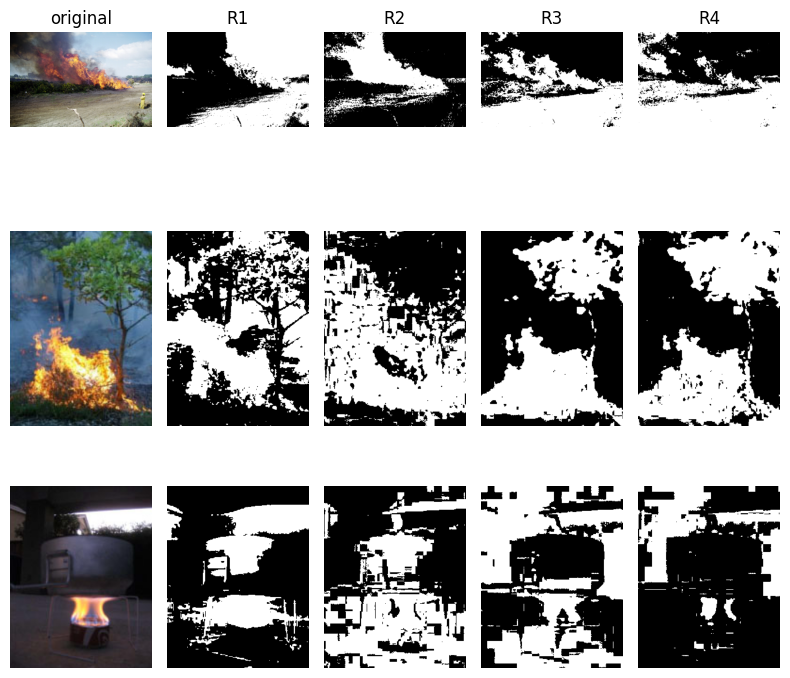

In [108]:
test_rs()

##Ps

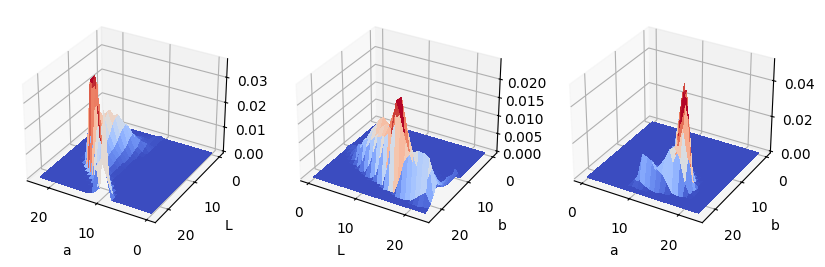

In [109]:
print_ps(p1, p2, p3)

##R5

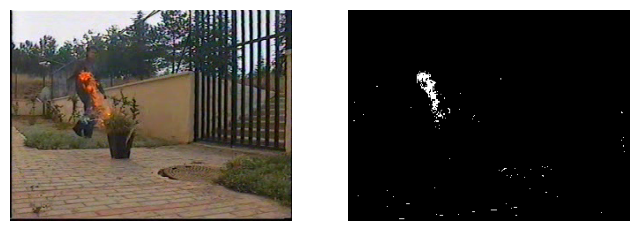

In [187]:
test_r5(video_fire1[200],alfa=0.0000016)

## Máscara R1 a R5

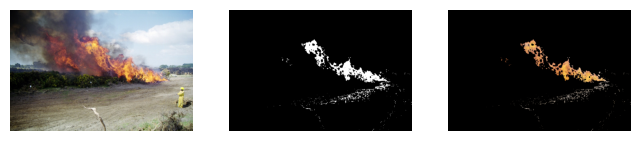

4


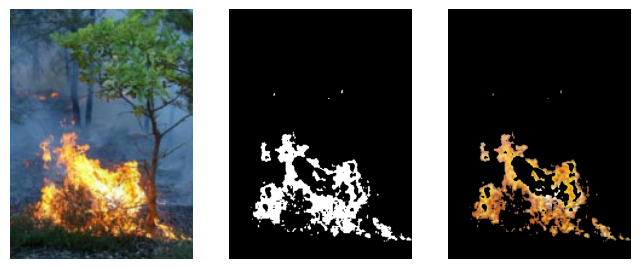

4


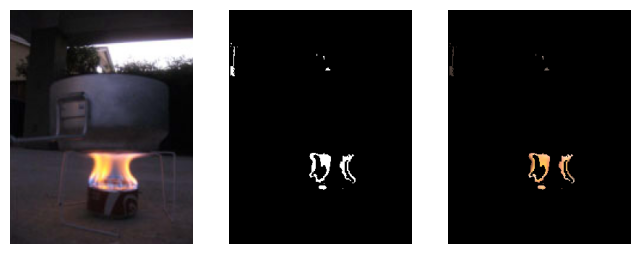

In [110]:
test_rs_mask("./images/sample2.jpg")
test_rs_mask("./images/paper_img1.png")
test_rs_mask("./images/paper_img2.png")

##Frame Difference

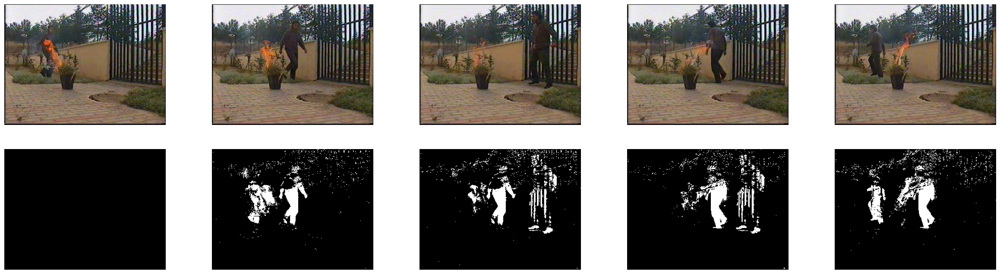

In [188]:
test_frame_difference(video_fire1[200:300:20])

##Sin y Con Frame Difference

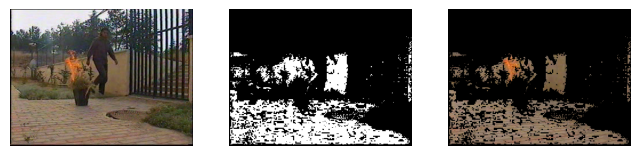

In [191]:
test_rs_video(video_fire1[220])

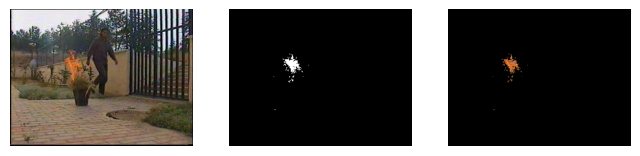

In [194]:
test_fd_rs(video_fire1[200], video_fire1[220])

##video

In [201]:
test_fd_rs_video(video_fire1[200:320],path="images/resultados/fire_segmented_fire1.avi",alfa=0.0000016)

guardando video


##Stationary Index

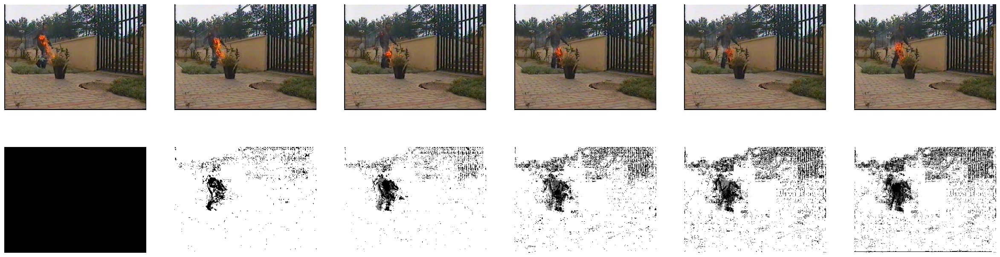

In [219]:
test_stationary_index(video_fire1[200:206])

##Background Image

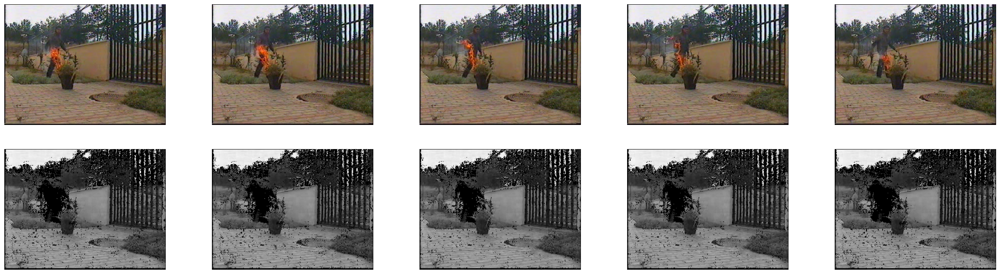

In [234]:
test_background_image(video_fire1[200:209:1])

###Background Difference

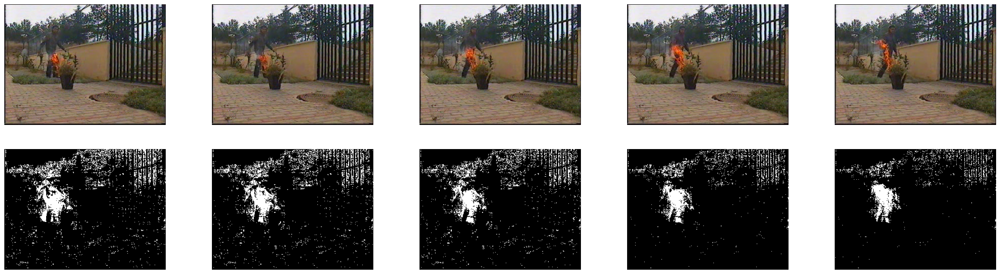

In [236]:
test_background_difference(video_fire1[200:208:1], si_thresh=3)

###Moving Pixels

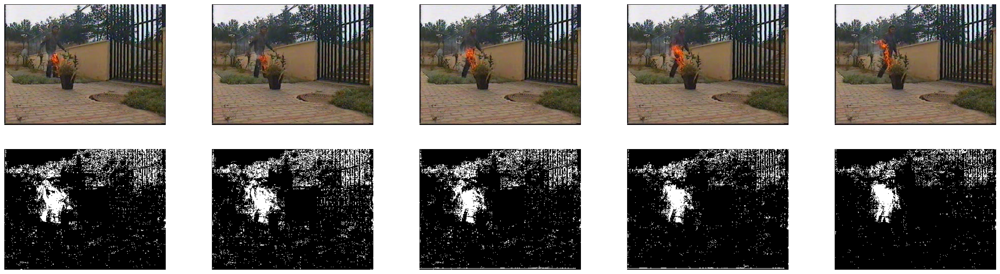

In [240]:
test_moving_pixel(video_fire1[200:208],3)

##Candidate Fire Pixels

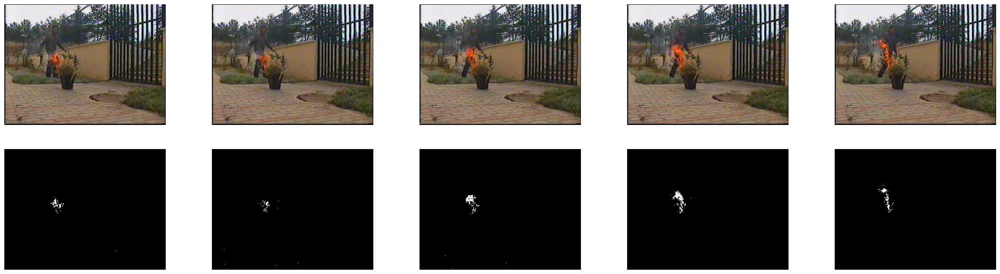

In [243]:
test_candidate_fire(video_fire1[200:208],3)

##Componentes Conexas

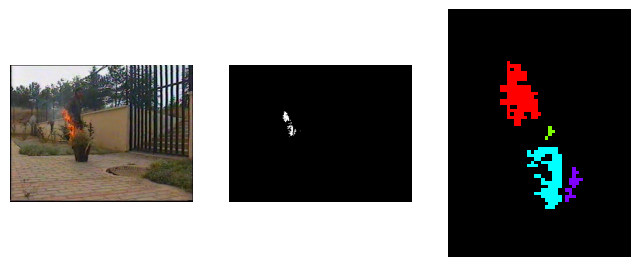

In [244]:
test_cc(video_fire1[200:211], idx=9, min_size=3)

1.0
2.0


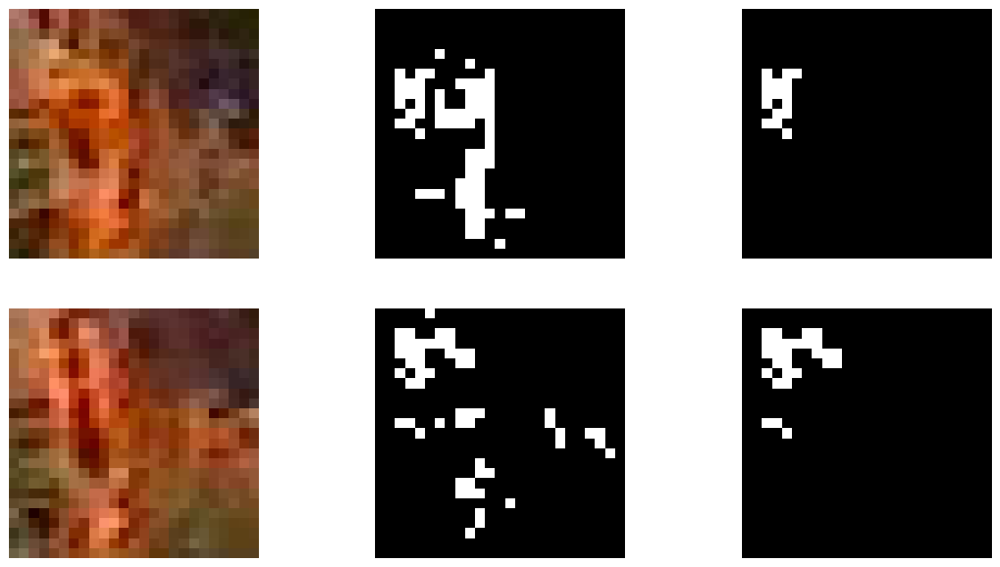

In [162]:
test_componente_conexa_en_el_tiempo()

In [142]:
test_cgo(video_fire1[200:210:1], 4, 3)

[1. 1. 1. 1. 1. 3. 1. 3. 1. 1. 1. 3. 3. 2. 2. 1. 1. 1. 3. 1. 1. 1. 1. 1.
 3. 1. 1. 1. 1. 3. 3. 5. 1. 1. 1. 1. 2. 1. 5. 1. 5. 2. 1. 1. 1. 1. 4. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 2. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 2.]


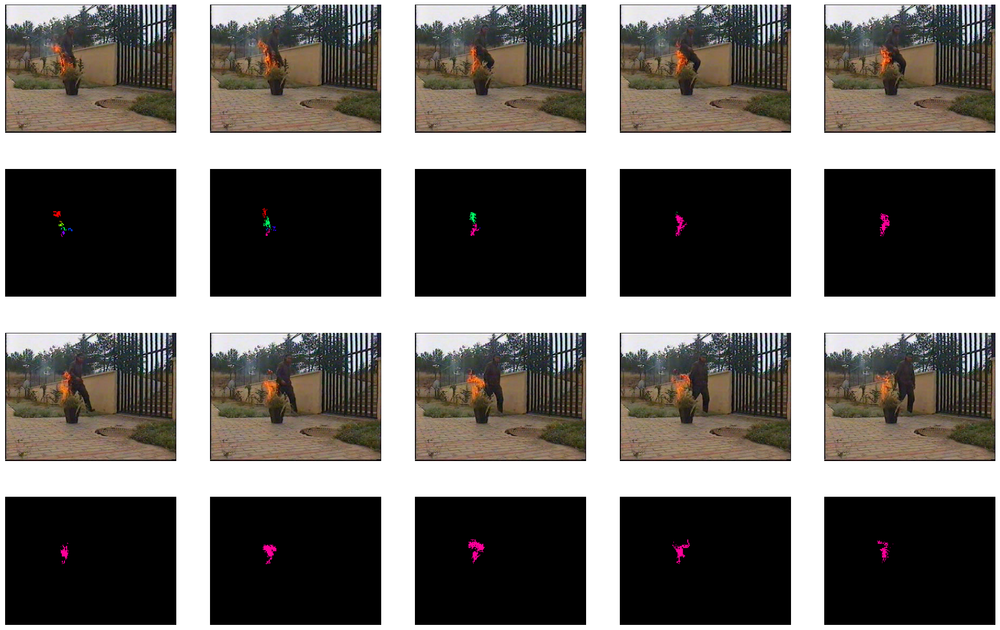

In [245]:
test_cgos_img(video_fire1[200:220:1], 10, 8, 4)

##D metric

In [246]:
d_metric_resultados_video_fire1 = test_d_metric(video_fire1[50:150], inicio=30, alfa=1e-7)

In [250]:
def video_tiene_fuego(video, inicio, fps=15, si_thres=7, alfa=1e-6):

    metrics = d_metric_video(video, inicio, fps, si_thres, alfa)
    frame = -1
    for f in range(len(metrics)):
        for cc in range(len(metrics[f])):
            if(metrics[f][cc] > 0.4):
                frame = f
                return frame + inicio + fps

    return frame

In [252]:
test_video_tiene_fuego(video_fire1[50:150], 30, alfa=1e-7)

guardando video
